# Music Recommendation on Yahoo Music DataSet

### DATASET DISCRIPTION: The dataset contains over 717 million ratings of 136 thousand songs given by 1.8 million users of Yahoo! Music services.(here using subset because of computational issues)

#### References Used:
1. GraphLab Create API Documentation

In [1]:
import numpy as np
import pandas as pd
import graphlab
import warnings
warnings.filterwarnings('ignore')

In [2]:
graphlab.product_key.get_product_key('195F-D2D7-942A-6C7F-7054-9CF4-C2B2-803A')

##  Loading Data

In [3]:
r_cols = ['user_id', 'song_id', 'rating', 'time']
rate_train = pd.read_csv('song_train.base', sep='\t', names=r_cols, encoding='latin-1')
rate_train.drop(['time'], axis=1);
rate_test = pd.read_csv('song_test.test', sep='\t', names=r_cols, encoding='latin-1')
rate_test.drop(['time'], axis=1);


### Creating Scalable dataframe

In [4]:
train_data = graphlab.SFrame(rate_train)
test_data = graphlab.SFrame(rate_test)

This non-commercial license of GraphLab Create for academic use is assigned to manja@usc.edu and will expire on April 04, 2019.


[INFO] graphlab.cython.cy_server: GraphLab Create v2.1 started. Logging: C:\Users\PRASHA~1\AppData\Local\Temp\graphlab_server_1524905467.log.0


In [5]:
train_data.head()

user_id,song_id,rating,time
1,1,5,874965758
1,2,3,876893171
1,3,4,878542960
1,4,3,876893119
1,5,3,889751712
1,6,5,887431973
1,7,4,875071561
1,8,1,875072484
1,9,5,878543541
1,10,3,875693118


In [6]:
train_data['song_id'].sketch_summary()



+--------------------+---------------+----------+
|        item        |     value     | is exact |
+--------------------+---------------+----------+
|       Length       |     90570     |   Yes    |
|        Min         |      1.0      |   Yes    |
|        Max         |     1682.0    |   Yes    |
|        Mean        | 428.104891244 |   Yes    |
|        Sum         |   38773460.0  |   Yes    |
|      Variance      | 110946.410374 |   Yes    |
| Standard Deviation | 333.086190608 |   Yes    |
|  # Missing Values  |       0       |   Yes    |
|  # unique values   |      1679     |    No    |
+--------------------+---------------+----------+

Most frequent items:
+-------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
| value |  50 | 100 | 181 | 258 | 286 | 294 |  1  | 288 | 121 | 174 |
+-------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
| count | 495 | 443 | 439 | 412 | 400 | 398 | 392 | 386 | 384 | 379 |
+-------+-----+-----+-----+-----+-----+-----+--

In [7]:
train_data.num_rows()

90570

In [8]:
train_data.show()

Canvas is accessible via web browser at the URL: http://localhost:61296/index.html
Opening Canvas in default web browser.


In [9]:
train_data.show(view="Summary")
train_data.show(view="Table")

Canvas is accessible via web browser at the URL: http://localhost:61296/index.html
Opening Canvas in default web browser.
Canvas is accessible via web browser at the URL: http://localhost:61296/index.html
Opening Canvas in default web browser.


In [10]:
graphlab.canvas.set_target('ipynb')
train_data['song_id'].show()

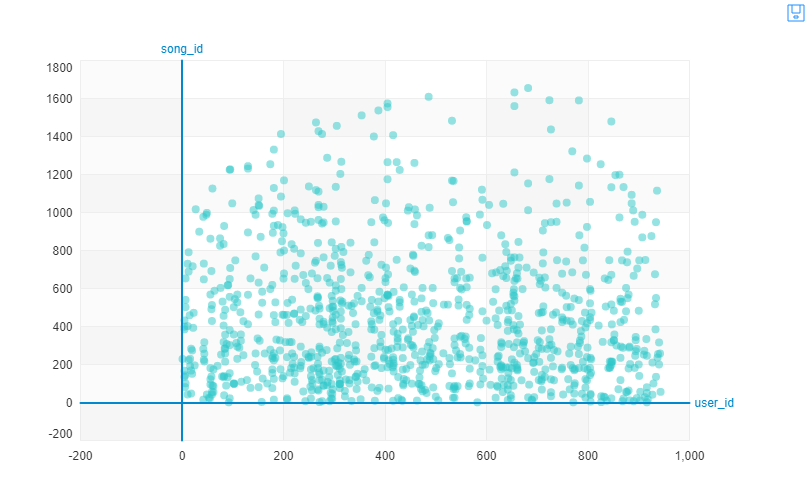

In [11]:
from IPython.display import Image
Image(filename='images/scatter_user_id_song_id.png')

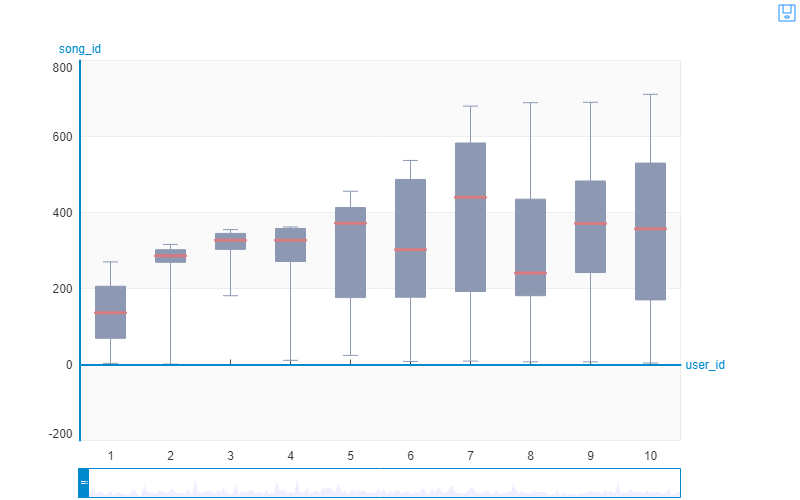

In [9]:
Image(filename='images/boxwhisker_user_id_song_id (1).png')


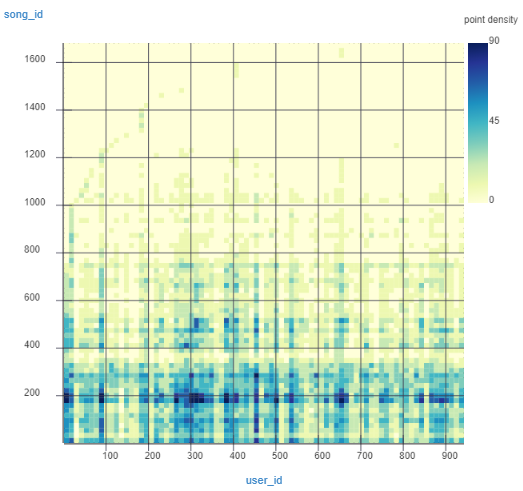

In [10]:
Image(filename='images/heatmap.PNG')

In [14]:
train_data['song_id'].show(view='Categorical')

In [15]:
train_data['rating'].show(view='Categorical')

In [16]:
num_of_users = train_data['user_id'].unique()
num_of_songs = train_data['song_id']
print "Number of Unique Users"
print len(num_of_users)
print "Number of songs"
print len(num_of_songs)

Number of Unique Users
943
Number of songs
90570


In [17]:
users = train_data['user_id'].unique()
print len(users)

943


In [18]:
train_data.show()

## 1. Popularity based Recommendation

#### Popularity is computed using the item’s mean target value. When the target column contains ratings, for example, the model computes the mean rating for each item and uses this to rank items for recommendations.

In [19]:
popularity_model1 = graphlab.popularity_recommender.create(train_data, user_id='user_id', item_id='song_id',target='rating')

Recsys training: model = popularity

Warning: Ignoring columns time;

To use these columns in scoring predictions, use a model that allows the use of additional features.

Preparing data set.

Data has 90570 observations with 943 users and 1680 items.

Data prepared in: 0.189012s

90570 observations to process; with 1680 unique items.

#### The one where all the users have same recommendation based on the most popular choices.

In [20]:
popularity_model = graphlab.popularity_recommender.create(train_data, user_id='user_id', item_id='song_id')

Recsys training: model = popularity

Warning: Ignoring columns rating, time;

To use one of these as a target column, set target = <column_name>

and use a method that allows the use of a target.

### Prediction using popuarity Based Model

In [21]:
popularity_model1.recommend(users=range(1,6),k=5)

Preparing data set.

Data has 90570 observations with 943 users and 1680 items.

Data prepared in: 0.122009s

90570 observations to process; with 1680 unique items.

user_id,song_id,score,rank
1,1599,5.0,1
1,1201,5.0,2
1,1189,5.0,3
1,1122,5.0,4
1,814,5.0,5
2,1599,5.0,1
2,1201,5.0,2
2,1189,5.0,3
2,1122,5.0,4
2,814,5.0,5


#### Here we observe that all the users in the user pool are recommended the same set of songs based on popularity

#### Evaluation of the popularity Model--Evaluate the model’s ability to make rating predictions or recommendations.

In [22]:
eval = popularity_model.evaluate(test_data)


Precision and recall summary statistics by cutoff
+--------+----------------+-----------------+
| cutoff | mean_precision |   mean_recall   |
+--------+----------------+-----------------+
|   1    | 0.185577942736 | 0.0185577942736 |
|   2    | 0.153764581124 | 0.0307529162248 |
|   3    | 0.137857900318 | 0.0413573700954 |
|   4    | 0.148197242842 | 0.0592788971368 |
|   5    | 0.148462354189 | 0.0742311770944 |
|   6    | 0.14669494521  | 0.0880169671262 |
|   7    | 0.14179669747  | 0.0992576882291 |
|   8    | 0.135471898197 |  0.108377518558 |
|   9    | 0.127960410039 |  0.115164369035 |
|   10   | 0.121633085896 |  0.121633085896 |
+--------+----------------+-----------------+
[10 rows x 3 columns]



In [23]:
popularity_model.evaluate_precision_recall(test_data)

{'precision_recall_by_user': Columns:
 	user_id	int
 	cutoff	int
 	precision	float
 	recall	float
 	count	int
 
 Rows: 16974
 
 Data:
 +---------+--------+----------------+--------+-------+
 | user_id | cutoff |   precision    | recall | count |
 +---------+--------+----------------+--------+-------+
 |    1    |   1    |      0.0       |  0.0   |   10  |
 |    1    |   2    |      0.0       |  0.0   |   10  |
 |    1    |   3    |      0.0       |  0.0   |   10  |
 |    1    |   4    |      0.0       |  0.0   |   10  |
 |    1    |   5    |      0.2       |  0.1   |   10  |
 |    1    |   6    | 0.166666666667 |  0.1   |   10  |
 |    1    |   7    | 0.142857142857 |  0.1   |   10  |
 |    1    |   8    |     0.125      |  0.1   |   10  |
 |    1    |   9    | 0.111111111111 |  0.1   |   10  |
 |    1    |   10   |      0.1       |  0.1   |   10  |
 +---------+--------+----------------+--------+-------+
 [16974 rows x 5 columns]
 Note: Only the head of the SFrame is printed.
 You can 

#### Rooted Mean Square Error --- Evaluate the prediction error for each user-item pair in the given data set.

In [24]:
popularity_model.evaluate_rmse(test_data, target='rating')

{'rmse_by_item': Columns:
 	song_id	int
 	count	int
 	rmse	float
 
 Rows: 1129
 
 Data:
 +---------+-------+---------------+
 | song_id | count |      rmse     |
 +---------+-------+---------------+
 |   118   |   28  | 261.823209164 |
 |   1029  |   1   |      12.0     |
 |   435   |   17  | 195.178349812 |
 |   537   |   1   |      26.0     |
 |   526   |   10  | 110.705465086 |
 |   232   |   8   | 89.7566153551 |
 |   310   |   27  | 114.561159471 |
 |    49   |   2   | 74.5016778335 |
 |    13   |   20  | 160.853193938 |
 |   511   |   15  | 153.535012294 |
 +---------+-------+---------------+
 [1129 rows x 3 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.,
 'rmse_by_user': Columns:
 	user_id	int
 	count	int
 	rmse	float
 
 Rows: 943
 
 Data:
 +---------+-------+---------------+
 | user_id | count |      rmse     |
 +---------+-------+---------------+
 |   118   |   10  | 190.121277084 |
 | 

#### A dictionary describing all the parameters of the given model and their current setting.

In [25]:
popularity_model.get_current_options()

{'item_id': 'song_id', 'random_seed': 1L, 'target': None, 'user_id': 'user_id'}

#### Get the number of items observed for each user.

In [26]:
popularity_model.get_num_items_per_user()

user_id,num_items
1,262
2,52
3,44
4,14
5,165
6,201
7,393
8,49
9,12
10,174


In [27]:
popularity_model.get_num_users_per_item()

song_id,num_users
1,392
2,121
3,85
4,198
5,79
6,23
7,346
8,194
9,268
10,82


#### Number of users who rated different set of songs---Get the number of users observed for each item.

In [28]:
popularity_model.get_similar_items()

song_id,similar,score,rank
1,294,0.999764522733,1
1,288,0.999764522733,2
1,286,0.999581373748,3
1,121,0.999581373748,4
1,174,0.998894565054,5
1,258,0.997383585926,6
1,127,0.989534343705,7
1,98,0.988461613935,8
1,56,0.987336555883,9
1,300,0.986754403752,10


In [29]:
popularity_model.list_fields()

['data_load_time',
 'item_id',
 'item_predictions',
 'item_side_data_column_names',
 'item_side_data_column_types',
 'model_name',
 'num_features',
 'num_item_side_features',
 'num_items',
 'num_observations',
 'num_user_side_features',
 'num_users',
 'observation_data_column_names',
 'random_seed',
 'target',
 'training_time',
 'user_id',
 'user_side_data_column_names',
 'user_side_data_column_types']

In [30]:
popularity_model.predict(test_data)

dtype: float
Rows: 9430
[61.0, 89.0, 56.0, 320.0, 96.0, 61.0, 57.0, 59.0, 258.0, 205.0, 164.0, 495.0, 41.0, 75.0, 123.0, 90.0, 88.0, 39.0, 66.0, 3.0, 197.0, 398.0, 192.0, 238.0, 88.0, 114.0, 52.0, 17.0, 17.0, 105.0, 495.0, 112.0, 83.0, 386.0, 398.0, 109.0, 60.0, 89.0, 243.0, 6.0, 392.0, 121.0, 85.0, 350.0, 29.0, 100.0, 44.0, 17.0, 4.0, 13.0, 161.0, 166.0, 292.0, 137.0, 350.0, 412.0, 186.0, 67.0, 53.0, 82.0, 78.0, 87.0, 96.0, 86.0, 136.0, 165.0, 53.0, 65.0, 62.0, 79.0, 280.0, 495.0, 311.0, 254.0, 203.0, 398.0, 81.0, 195.0, 23.0, 145.0, 23.0, 400.0, 169.0, 155.0, 165.0, 59.0, 87.0, 115.0, 179.0, 15.0, 346.0, 36.0, 443.0, 191.0, 143.0, 70.0, 55.0, 59.0, 111.0, 39.0, ... ]

#### Get the k most similar items for each item in items.

In [31]:
popularity_model.recommend()

user_id,song_id,score,rank
1,286,400.0,1
1,294,398.0,2
1,288,386.0,3
1,300,347.0,4
1,117,320.0,5
1,405,303.0,6
1,313,278.0,7
1,423,277.0,8
1,318,269.0,9
1,276,269.0,10


In [32]:
data = train_data.select_columns(['song_id','rating'])
popularity_model.recommend_from_interactions(data)


song_id,score,rank
1582,0.018549188473,1
1653,0.018549188473,2


In [33]:
popularity_model.show()

#### Return a score prediction for the user ids and item ids in the provided data set.

In [34]:
popularity_model.summary()

Class                            : PopularityRecommender

Schema
------
User ID                          : user_id
Item ID                          : song_id
Target                           : None
Additional observation features  : 0
User side features               : []
Item side features               : []

Statistics
----------
Number of observations           : 90570
Number of users                  : 943
Number of items                  : 1680

Training summary
----------------
Training time                    : 0.002

Model Parameters
----------------
Model class                      : PopularityRecommender



## 2. Build a song recommender with personalization (personalized recommendations to each user)

In [35]:
#Train Model
personalized_model = graphlab.item_similarity_recommender.create(train_data, user_id='user_id', item_id='song_id', target='rating', similarity_type='cosine')

#Make Recommendations:
item_sim_recomm = personalized_model.recommend(users=range(1,6),k=5)
item_sim_recomm.print_rows(num_rows=25)

Recsys training: model = item_similarity

Warning: Ignoring columns time;

To use these columns in scoring predictions, use a model that allows the use of additional features.

Preparing data set.

Data has 90570 observations with 943 users and 1680 items.

Data prepared in: 0.234014s

Training model from provided data.

Gathering per-item and per-user statistics.

+--------------------------------+------------+

| Elapsed Time (Item Statistics) | % Complete |

+--------------------------------+------------+

| 7.001ms                        | 100        |

+--------------------------------+------------+

Setting up lookup tables.

Processing data in one pass using dense lookup tables.

+-------------------------------------+------------------+-----------------+

| Elapsed Time (Constructing Lookups) | Total % Complete | Items Processed |

+-------------------------------------+------------------+-----------------+

| 25.009ms                            | 0                | 0               |

| 434.027ms                           | 100              | 1680            |

+-------------------------------------+------------------+-----------------+

Finalizing lookup tables.

Generating candidate set for working with new users.

Finished training in 1.45708s

+---------+---------+----------------+------+
| user_id | song_id |     score      | rank |
+---------+---------+----------------+------+
|    1    |   423   | 0.980611449435 |  1   |
|    1    |   202   | 0.949590799235 |  2   |
|    1    |   655   | 0.816206020481 |  3   |
|    1    |   403   | 0.765623665038 |  4   |
|    1    |   568   | 0.763973428775 |  5   |
|    2    |    50   | 1.12562584877  |  1   |
|    2    |   181   | 1.06517731685  |  2   |
|    2    |    7    | 0.999819083856 |  3   |
|    2    |   121   | 0.922513024165 |  4   |
|    2    |   117   | 0.792605129572 |  5   |
|    3    |   313   | 0.635376662016 |  1   |
|    3    |   328   | 0.603288030083 |  2   |
|    3    |   315   | 0.542258712378 |  3   |
|    3    |   331   | 0.535507185893 |  4   |
|    3    |   332   | 0.531669611281 |  5   |
|    4    |    50   | 1.13114770821  |  1   |
|    4    |   288   | 1.04871511459  |  2   |
|    4    |   181   | 0.950599938631 |  3   |
|    4    |    7    | 0.9417778807

#### This is done by making an item-item matrix in which we keep a record of the pair of items which were rated together.

#### Recommender that uses item-item similarities based on users in common.

### Finding  similar songs to any song in the dataset

In [36]:
personalized_model.get_similar_items()

song_id,similar,score,rank
1,50,0.651777803898,1
1,181,0.636943340302,2
1,121,0.635370850563,3
1,174,0.592788994312,4
1,405,0.591268002987,5
1,237,0.586470067501,6
1,222,0.583917498589,7
1,100,0.580404996872,8
1,151,0.578688085079,9
1,117,0.578327476978,10


# Quantitative comparison between the models

We now formally compare the popularity and the personalized models using precision-recall curves. 

In [37]:
if graphlab.version[:3] >= "1.6":
    model_performance = graphlab.compare(test_data, [popularity_model, personalized_model], user_sample=0.05)
    graphlab.show_comparison(model_performance,[popularity_model, personalized_model])
else:
    %matplotlib inline
    model_performance = graphlab.recommender.util.compare_models(test_data, [popularity_model, personalized_model], user_sample=.05)

compare_models: using 47 users to estimate model performance
PROGRESS: Evaluate model M0



Precision and recall summary statistics by cutoff
+--------+----------------+-----------------+
| cutoff | mean_precision |   mean_recall   |
+--------+----------------+-----------------+
|   1    | 0.191489361702 | 0.0191489361702 |
|   2    | 0.127659574468 | 0.0255319148936 |
|   3    | 0.127659574468 | 0.0382978723404 |
|   4    | 0.13829787234  | 0.0553191489362 |
|   5    | 0.136170212766 |  0.068085106383 |
|   6    | 0.13475177305  | 0.0808510638298 |
|   7    | 0.139817629179 | 0.0978723404255 |
|   8    | 0.135638297872 |  0.108510638298 |
|   9    | 0.13475177305  |  0.121276595745 |
|   10   | 0.123404255319 |  0.123404255319 |
+--------+----------------+-----------------+
[10 rows x 3 columns]

PROGRESS: Evaluate model M1

Precision and recall summary statistics by cutoff
+--------+----------------+-----------------+
| cutoff | mean_precision |   mean_recall   |
+--------+----------------+-----------------+
|   1    | 0.510638297872 | 0.0510638297872 |
|   2    | 0.393617

#### Having limited set of data and also because of it being very scewed we observe that popularity model outperforms the personalised model.Which is ideally not the case as refered on the code run of differnt dataset which mimiced the large dataset provided by yahoo!!

In [38]:
train_data.print_rows(num_rows=20, num_columns=4)

+---------+---------+--------+-----------+
| user_id | song_id | rating |    time   |
+---------+---------+--------+-----------+
|    1    |    1    |   5    | 874965758 |
|    1    |    2    |   3    | 876893171 |
|    1    |    3    |   4    | 878542960 |
|    1    |    4    |   3    | 876893119 |
|    1    |    5    |   3    | 889751712 |
|    1    |    6    |   5    | 887431973 |
|    1    |    7    |   4    | 875071561 |
|    1    |    8    |   1    | 875072484 |
|    1    |    9    |   5    | 878543541 |
|    1    |    10   |   3    | 875693118 |
|    1    |    11   |   2    | 875072262 |
|    1    |    12   |   5    | 878542960 |
|    1    |    13   |   5    | 875071805 |
|    1    |    14   |   5    | 874965706 |
|    1    |    15   |   5    | 875071608 |
|    1    |    16   |   5    | 878543541 |
|    1    |    17   |   3    | 875073198 |
|    1    |    18   |   4    | 887432020 |
|    1    |    19   |   5    | 875071515 |
|    1    |    21   |   1    | 878542772 |
+---------+

#### Evaluation of the personalised Model--Evaluate the model’s ability to make rating predictions or recommendations.

In [39]:
eval = personalized_model.evaluate(test_data)


Precision and recall summary statistics by cutoff
+--------+----------------+-----------------+
| cutoff | mean_precision |   mean_recall   |
+--------+----------------+-----------------+
|   1    | 0.384941675504 | 0.0384941675504 |
|   2    | 0.329268292683 | 0.0658536585366 |
|   3    | 0.289501590668 | 0.0868504772004 |
|   4    | 0.265641569459 |  0.106256627784 |
|   5    | 0.244962884411 |  0.122481442206 |
|   6    | 0.227642276423 |  0.136585365854 |
|   7    | 0.212695046205 |  0.148886532344 |
|   8    | 0.200954400848 |  0.160763520679 |
|   9    | 0.19288323318  |  0.173594909862 |
|   10   | 0.184941675504 |  0.184941675504 |
+--------+----------------+-----------------+
[10 rows x 3 columns]



('\nOverall RMSE: ', 3.360986245655777)

Per User RMSE (best)
+---------+-------+---------------+
| user_id | count |      rmse     |
+---------+-------+---------------+
|   774   |   10  | 1.62827859054 |
+---------+-------+---------------+
[1 rows x 3 columns]


Per User RMSE (worst)
+---------+-------+---------------+
| user_id | count |      rmse     |
+---------+-------+---------------+
|   200   |   10  | 4.59700778193 |
+---------+-------+---------------+
[1 rows x 3 columns]


Per Item RMSE (best)
+---------+-------+---------------+
| song_id | count |      rmse     |
+---------+-------+---------------+
|   1255  |   1   | 0.80073373268 |
+---------+-------+---------------+
[1 rows x 3 columns]


Per Item RMSE (worst)
+---------+-------+------+
| song_id | count | rmse |
+---------+-------+------+
|   1114  |   1   | 5.0  |
+---------+-------+------+
[1 rows x 3 columns]



#### Personalized_model precision and recall scores for a particular dataset

In [40]:
warnings.filterwarnings('ignore')
personalized_model.evaluate_precision_recall(test_data)

{'precision_recall_by_user': Columns:
 	user_id	int
 	cutoff	int
 	precision	float
 	recall	float
 	count	int
 
 Rows: 16974
 
 Data:
 +---------+--------+----------------+--------+-------+
 | user_id | cutoff |   precision    | recall | count |
 +---------+--------+----------------+--------+-------+
 |    1    |   1    |      0.0       |  0.0   |   10  |
 |    1    |   2    |      0.5       |  0.1   |   10  |
 |    1    |   3    | 0.333333333333 |  0.1   |   10  |
 |    1    |   4    |      0.25      |  0.1   |   10  |
 |    1    |   5    |      0.2       |  0.1   |   10  |
 |    1    |   6    | 0.166666666667 |  0.1   |   10  |
 |    1    |   7    | 0.285714285714 |  0.2   |   10  |
 |    1    |   8    |      0.25      |  0.2   |   10  |
 |    1    |   9    | 0.222222222222 |  0.2   |   10  |
 |    1    |   10   |      0.2       |  0.2   |   10  |
 +---------+--------+----------------+--------+-------+
 [16974 rows x 5 columns]
 Note: Only the head of the SFrame is printed.
 You can 

#### Evaluate the prediction error for each user-song pair in the given data set.


In [41]:
personalized_model.evaluate_rmse(test_data, target='rating')

{'rmse_by_item': Columns:
 	song_id	int
 	count	int
 	rmse	float
 
 Rows: 1129
 
 Data:
 +---------+-------+---------------+
 | song_id | count |      rmse     |
 +---------+-------+---------------+
 |   118   |   28  |  2.589307972  |
 |   1029  |   1   |      1.0      |
 |   435   |   17  | 3.55006658395 |
 |   537   |   1   |      3.0      |
 |   526   |   10  | 3.34972002123 |
 |   232   |   8   | 3.20419868308 |
 |   310   |   27  | 3.26215122354 |
 |    49   |   2   | 4.45623152027 |
 |    13   |   20  | 2.93116944155 |
 |   511   |   15  | 4.15105591516 |
 +---------+-------+---------------+
 [1129 rows x 3 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.,
 'rmse_by_user': Columns:
 	user_id	int
 	count	int
 	rmse	float
 
 Rows: 943
 
 Data:
 +---------+-------+---------------+
 | user_id | count |      rmse     |
 +---------+-------+---------------+
 |   118   |   10  | 4.33066418726 |
 | 

#### A dictionary describing all the parameters of the Personalised model and their current setting.

In [42]:
personalized_model.get_current_options()

{'degree_approximation_threshold': 4096L,
 'item_id': 'song_id',
 'max_data_passes': 4096L,
 'max_item_neighborhood_size': 64L,
 'nearest_neighbors_interaction_proportion_threshold': 0.05,
 'seed_item_set_size': 50L,
 'similarity_type': 'cosine',
 'sparse_density_estimation_sample_size': 4096L,
 'target': 'rating',
 'target_memory_usage': 8589934592L,
 'threshold': 0.001,
 'training_method': 'auto',
 'user_id': 'user_id'}

In [43]:
personalized_model.get_num_users_per_item()
## An SFrame with a column containing each observed item and another column containing the corresponding number of items observed during training.


song_id,num_users
1,392
2,121
3,85
4,198
5,79
6,23
7,346
8,194
9,268
10,82


#### Get the number of users observed for each item.

In [44]:
personalized_model.get_num_items_per_user()
##An SFrame with a column containing each observed user and another column containing the corresponding number of items observed during training.

user_id,num_items
1,262
2,52
3,44
4,14
5,165
6,201
7,393
8,49
9,12
10,174


In [45]:
nn = personalized_model.get_similar_items()
nn.show()

#### Get the current settings of the model.

In [46]:
personalized_model.list_fields()
##Get the current settings of the model. The keys depend on the type of model

['data_load_time',
 'degree_approximation_threshold',
 'item_id',
 'item_side_data_column_names',
 'item_side_data_column_types',
 'max_data_passes',
 'max_item_neighborhood_size',
 'model_name',
 'nearest_neighbors_interaction_proportion_threshold',
 'num_features',
 'num_item_side_features',
 'num_items',
 'num_observations',
 'num_user_side_features',
 'num_users',
 'observation_data_column_names',
 'seed_item_set_size',
 'similarity_type',
 'sparse_density_estimation_sample_size',
 'target',
 'target_memory_usage',
 'threshold',
 'training_method',
 'training_rmse',
 'training_time',
 'user_id',
 'user_side_data_column_names',
 'user_side_data_column_types']

In [47]:
model_name = personalized_model.name()
print model_name

ItemSimilarityRecommender


In [48]:
data = train_data.select_columns(['song_id','rating'])
personalized_model.recommend_from_interactions(data)

song_id,score,rank
1582,0.0,1
1653,0.0,2


In [49]:
personalized_model.show()

### Get the Summary of the model

In [50]:
personalized_model.summary()

Class                            : ItemSimilarityRecommender

Schema
------
User ID                          : user_id
Item ID                          : song_id
Target                           : rating
Additional observation features  : 0
User side features               : []
Item side features               : []

Statistics
----------
Number of observations           : 90570
Number of users                  : 943
Number of items                  : 1680

Training summary
----------------
Training time                    : 1.4571

Model Parameters
----------------
Model class                      : ItemSimilarityRecommender
threshold                        : 0.001
similarity_type                  : cosine
training_method                  : auto

Other Settings
--------------
degree_approximation_threshold   : 4096
sparse_density_estimation_sample_size : 4096
max_data_passes                  : 4096
target_memory_usage              : 8589934592
seed_item_set_size               : 50
near

similarity_graph = graphlab.SGraph().add_edges(similar_songs,src_field='song_id',dst_field = 'similar')
similarity_graph.summary()

## 3. Rating Performance_Factorization recommender

###  Factorization Recommender learns latent factors for each user and song and uses them to make rating predictions. This includes both standard matrix factorization as well as factorization machines models.

In [51]:
# Train the model
factorization_model = graphlab.recommender.factorization_recommender.create(train_data, user_id='user_id', item_id='song_id', target='rating')


Recsys training: model = factorization_recommender

Preparing data set.

Data has 90570 observations with 943 users and 1680 items.

Data prepared in: 0.374027s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-008   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-010   |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 11321 / 90570 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 16.6667           | Not Viable                               |

| 1       | 4.16667           | Not Viable                               |

| 2       | 1.04167           | Not Viable                               |

| 3       | 0.260417          | 0.61144                                  |

| 4       | 0.130208          | 0.332113                                 |

| 5       | 0.0651042         | 0.543719                                 |

| 6       | 0.0325521         | 0.82529                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.130208          | 0.332113                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 0us          | 1.26804           | 1.12607               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 458.023ms    | 1.01461           | 1.00727               | 0.130208    |

| 2       | 610.033ms    | 0.853216          | 0.923692              | 0.130208    |

| 3       | 924.053ms    | 0.792908          | 0.890448              | 0.130208    |

| 4       | 1.19s        | 0.757269          | 0.870206              | 0.130208    |

#### Evaluate the model’s ability to make rating predictions or recommendations.

In [52]:
factorization_model.evaluate(test_data)

| 5       | 1.31s        | 0.729704          | 0.85422               | 0.130208    |

| 6       | 1.42s        | 0.709574          | 0.842354              | 0.130208    |

| 10      | 1.82s        | 0.660021          | 0.812406              | 0.130208    |

| 11      | 1.97s        | 0.652134          | 0.807538              | 0.130208    |

| 15      | 2.37s        | 0.62852           | 0.79278               | 0.130208    |

| 20      | 3.06s        | 0.608963          | 0.780347              | 0.130208    |

| 25      | 3.69s        | 0.59614           | 0.772086              | 0.130208    |

| 30      | 4.45s        | 0.586588          | 0.765874              | 0.130208    |

| 35      | 5.08s        | 0.58019           | 0.761685              | 0.130208    |

| 40      | 5.66s        | 0.576779          | 0.759442              | 0.130208    |

| 45      | 6.30s        | 0.587526          | 0.766484              | 0.130208    |

| 50      | 6.96s        | 0.582992          | 0.76352               | 0.130208    |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.571541

Final training RMSE: 0.755984


Precision and recall summary statistics by cutoff
+--------+-----------------+------------------+
| cutoff |  mean_precision |   mean_recall    |
+--------+-----------------+------------------+
|   1    | 0.0540827147402 | 0.00540827147402 |
|   2    | 0.0477200424178 | 0.00954400848356 |
|   3    | 0.0427712972782 | 0.0128313891835  |
|   4    | 0.0395015906681 | 0.0158006362672  |
|   5    |  0.037539766702 |  0.018769883351  |
|   6    | 0.0365853658537 | 0.0219512195122  |
|   7    | 0.0352976821694 | 0.0247083775186  |
|   8    | 0.0345970307529 | 0.0276776246023  |
|   9    | 0.0334629433251 | 0.0301166489926  |
|   10   |  0.032131495228 |  0.032131495228  |
+--------+-----------------+------------------+
[10 rows x 3 columns]

('\nOverall RMSE: ', 0.9827548724895355)

Per User RMSE (best)
+---------+-------+----------------+
| user_id | count |      rmse      |
+---------+-------+----------------+
|   686   |   10  | 0.245598504144 |
+---------+-------+----------------+
[1 row

{'precision_recall_by_user': Columns:
 	user_id	int
 	cutoff	int
 	precision	float
 	recall	float
 	count	int
 
 Rows: 16974
 
 Data:
 +---------+--------+-----------+--------+-------+
 | user_id | cutoff | precision | recall | count |
 +---------+--------+-----------+--------+-------+
 |    1    |   1    |    0.0    |  0.0   |   10  |
 |    1    |   2    |    0.0    |  0.0   |   10  |
 |    1    |   3    |    0.0    |  0.0   |   10  |
 |    1    |   4    |    0.0    |  0.0   |   10  |
 |    1    |   5    |    0.0    |  0.0   |   10  |
 |    1    |   6    |    0.0    |  0.0   |   10  |
 |    1    |   7    |    0.0    |  0.0   |   10  |
 |    1    |   8    |    0.0    |  0.0   |   10  |
 |    1    |   9    |    0.0    |  0.0   |   10  |
 |    1    |   10   |    0.0    |  0.0   |   10  |
 +---------+--------+-----------+--------+-------+
 [16974 rows x 5 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and colum

#### Evaluate the prediction error for each user-item pair in the given data set.

In [53]:

# Evaluate the model
rmse_data = factorization_model.evaluate_rmse(test_data, target="rating")

In [54]:
# Print the results
print rmse_data

{'rmse_by_user': Columns:
	user_id	int
	count	int
	rmse	float

Rows: 943

Data:
+---------+-------+----------------+
| user_id | count |      rmse      |
+---------+-------+----------------+
|   118   |   10  | 0.702836062366 |
|   435   |   10  | 1.13512851505  |
|   537   |   10  | 0.726713546765 |
|   526   |   10  | 0.910711877364 |
|   232   |   10  | 1.21681163428  |
|   310   |   10  | 1.33651171171  |
|    49   |   10  | 0.92893035336  |
|    13   |   10  | 1.29843465738  |
|   511   |   10  | 1.12493083373  |
|   363   |   10  | 1.25974828283  |
+---------+-------+----------------+
[943 rows x 3 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns., 'rmse_by_item': Columns:
	song_id	int
	count	int
	rmse	float

Rows: 1129

Data:
+---------+-------+----------------+
| song_id | count |      rmse      |
+---------+-------+----------------+
|   118   |   28  | 0.825437110581 |
|   1029  |   1   | 1.

#### Compute a factorization model's precision and recall scores for a particular dataset.

In [55]:
factorization_model.evaluate_precision_recall(test_data)


{'precision_recall_by_user': Columns:
 	user_id	int
 	cutoff	int
 	precision	float
 	recall	float
 	count	int
 
 Rows: 16974
 
 Data:
 +---------+--------+-----------+--------+-------+
 | user_id | cutoff | precision | recall | count |
 +---------+--------+-----------+--------+-------+
 |    1    |   1    |    0.0    |  0.0   |   10  |
 |    1    |   2    |    0.0    |  0.0   |   10  |
 |    1    |   3    |    0.0    |  0.0   |   10  |
 |    1    |   4    |    0.0    |  0.0   |   10  |
 |    1    |   5    |    0.0    |  0.0   |   10  |
 |    1    |   6    |    0.0    |  0.0   |   10  |
 |    1    |   7    |    0.0    |  0.0   |   10  |
 |    1    |   8    |    0.0    |  0.0   |   10  |
 |    1    |   9    |    0.0    |  0.0   |   10  |
 |    1    |   10   |    0.0    |  0.0   |   10  |
 +---------+--------+-----------+--------+-------+
 [16974 rows x 5 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and colum

In [56]:
factorization_model.get_similar_items()

song_id,similar,score,rank
1,1125,0.940010726452,1
1,1483,0.895927250385,2
1,95,0.88452911377,3
1,1189,0.872261464596,4
1,384,0.864439845085,5
1,1112,0.846837460995,6
1,577,0.844581842422,7
1,1410,0.840562105179,8
1,985,0.83564555645,9
1,545,0.832424581051,10


#### Grouping Similar Users

In [57]:
factorization_model.get_similar_users()

Getting similar users completed in 0.014003

user_id,similar,score,rank
1,479,0.920980572701,1
1,322,0.805272936821,2
1,92,0.803369939327,3
1,379,0.797290384769,4
1,679,0.789913594723,5
1,392,0.785299062729,6
1,47,0.773992657661,7
1,151,0.761358141899,8
1,135,0.753137052059,9
1,875,0.744352281094,10


#### Get the current settings of the model.

In [58]:
factorization_model.list_fields()

['adagrad_momentum_weighting',
 'additional_iterations_if_unhealthy',
 'binary_target',
 'coefficients',
 'data_load_time',
 'init_random_sigma',
 'item_id',
 'item_side_data_column_names',
 'item_side_data_column_types',
 'linear_regularization',
 'max_iterations',
 'model_name',
 'nmf',
 'num_factors',
 'num_features',
 'num_item_side_features',
 'num_items',
 'num_observations',
 'num_tempering_iterations',
 'num_user_side_features',
 'num_users',
 'observation_data_column_names',
 'random_seed',
 'regularization',
 'regularization_type',
 'sgd_convergence_interval',
 'sgd_convergence_threshold',
 'sgd_max_trial_iterations',
 'sgd_sampling_block_size',
 'sgd_step_adjustment_interval',
 'sgd_step_size',
 'sgd_trial_sample_minimum_size',
 'sgd_trial_sample_proportion',
 'side_data_factorization',
 'solver',
 'step_size_decrease_rate',
 'target',
 'tempering_regularization_start_value',
 'track_exact_loss',
 'training_rmse',
 'training_stats',
 'training_time',
 'user_id',
 'user_side_

In [59]:
factorization_model.predict(test_data)

dtype: float
Rows: 9430
[4.378361277593233, 3.475118398044678, 3.7678681193281345, 2.993743583771268, 1.9679113226830425, 3.9805407828646944, 4.570373977789397, 4.28414678408277, 4.577618341520223, 3.923389418477928, 3.3312253547304187, 4.711654655699254, 4.562305174831868, 2.9770476375668133, 3.1967560354965157, 3.25016357050825, 4.425097519146342, 4.066662796065322, 3.2510912705857975, 2.6788070407246227, 2.9159296280944904, 1.5511877979100186, 2.044604400407039, 2.785156746500998, 2.434033949965506, 3.3073505397717904, 4.081938872404244, 1.692685524235927, 3.6305553734469114, 3.2350644714309245, 5.061733805418553, 3.052995900447259, 4.014758686358819, 3.2691090662462545, 2.77893202917292, 4.983114879510225, 3.6276418242906794, 3.760868043964619, 5.4538406948809195, 4.328982797667907, 3.6086651598350112, 2.7223685729956393, 3.628400030077281, 3.55415146612495, 1.6662407849746144, 2.116702785979677, 3.1975897960729824, 1.0025860406118412, 1.2871704063737877, 1.112643865441688, 3.92568

### Recommendations

In [60]:
factorization_model.recommend(users=range(1,6),k=5)

user_id,song_id,score,rank
1,408,5.27454926763,1
1,718,5.15971787964,2
1,647,5.14999052082,3
1,1073,5.13452970181,4
1,511,5.06232710873,5
2,178,5.00295795818,1
2,511,4.91625233312,2
2,98,4.88248597403,3
2,135,4.87640796919,4
2,480,4.86427969058,5


### Summary of the model

In [61]:
factorization_model.summary()

Class                            : FactorizationRecommender

Schema
------
User ID                          : user_id
Item ID                          : song_id
Target                           : rating
Additional observation features  : 1
User side features               : []
Item side features               : []

Statistics
----------
Number of observations           : 90570
Number of users                  : 943
Number of items                  : 1680

Training summary
----------------
Training time                    : 7.6244

Model Parameters
----------------
Model class                      : FactorizationRecommender
num_factors                      : 8
binary_target                    : 0
side_data_factorization          : 1
solver                           : auto
nmf                              : 0
max_iterations                   : 50

Regularization Settings
-----------------------
regularization                   : 0.0
regularization_type              : normal
linear_regula

In [62]:
factorization_model.show()

## 4.Creating a ranking_factorization_recommender (Optimising)

#### Ranking Factorization Recommender learns latent factors for each user and song and uses them to make rating predictions.

In [63]:
rec_model = graphlab.recommender.create(train_data,user_id='user_id', item_id='song_id', target='rating')

Recsys training: model = ranking_factorization_recommender

Preparing data set.

Data has 90570 observations with 943 users and 1680 items.

Data prepared in: 0.326025s

Training ranking_factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 32       |

| regularization                 | L2 Regularization on Factors                     | 1e-009   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-009   |

| ranking_regularization         | Rank-based Regularization Weight                 | 0.25     |

| max_iterations                 | Maximum Number of Iterations                     | 25       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 11321 / 90570 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 16.6667           | Not Viable                               |

| 1       | 4.16667           | Not Viable                               |

| 2       | 1.04167           | Not Viable                               |

| 3       | 0.260417          | Not Viable                               |

| 4       | 0.0651042         | 1.8811                                   |

| 5       | 0.0325521         | 1.8418                                   |

| 6       | 0.016276          | 1.99953                                  |

| 7       | 0.00813802        | 2.11723                                  |

| 8       | 0.00406901        | 2.24914                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0325521         | 1.8418                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

#### Evaluate the prediction error for each user-item pair in the given data set.


In [64]:
# Evaluate the model
rmse_data_new = rec_model.evaluate_rmse(test_data, target="rating")


+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 0us          | 2.48614           | 1.12606               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 632.038ms    | 2.0501            | 1.09618               | 0.0325521   |

| 2       | 1.06s        | 1.88361           | 1.04376               | 0.0325521   |

| 3       | 1.50s        | 1.85157           | 1.03762               | 0.0325521   |

| 4       | 1.94s        | 1.82041           | 1.02965               | 0.0325521   |

| 5       | 2.38s        | 1.80001           | 1.0226                | 0.0325521   |

| 6       | 2.79s        | 1.77991           | 1.01592               | 0.0325521   |

| 10      | 4.46s        | 1.71998           | 0.994951              | 0.0325521   |

| 11      | 4.92s        | 1.71149           | 0.991482              | 0.0325521   |

| 15      | 6.60s        | 1.69318           | 0.982984              | 0.0325521   |

| 20      | 8.82s        | 1.70298           | 0.97145               | 0.0325521   |

| 25      | 10.96s       | 1.65966           | 0.964868              | 0.0325521   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 1.69219

In [65]:
# Print the results
print rmse_data_new

Final training RMSE: 0.952026

{'rmse_by_user': Columns:
	user_id	int
	count	int
	rmse	float

Rows: 943

Data:
+---------+-------+----------------+
| user_id | count |      rmse      |
+---------+-------+----------------+
|   118   |   10  |  1.0454350375  |
|   435   |   10  | 1.07699477502  |
|   537   |   10  | 0.698929611337 |
|   526   |   10  | 0.867136192548 |
|   232   |   10  | 1.26849720872  |
|   310   |   10  | 1.18351224614  |
|    49   |   10  | 1.18341054373  |
|    13   |   10  | 1.01740270851  |
|   511   |   10  | 1.11824743935  |
|   363   |   10  | 1.24225789492  |
+---------+-------+----------------+
[943 rows x 3 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns., 'rmse_by_item': Columns:
	song_id	int
	count	int
	rmse	float

Rows: 1129

Data:
+---------+-------+----------------+
| song_id | count |      rmse      |
+---------+-------+----------------+
|   118   |   28  | 0.781955876326 |
|   1029  |   1   | 1.

#### Recommendation

In [66]:
recommendations = rec_model.recommend()

In [67]:
rec_model.evaluate_precision_recall(test_data)

{'precision_recall_by_user': Columns:
 	user_id	int
 	cutoff	int
 	precision	float
 	recall	float
 	count	int
 
 Rows: 16974
 
 Data:
 +---------+--------+-----------+--------+-------+
 | user_id | cutoff | precision | recall | count |
 +---------+--------+-----------+--------+-------+
 |    1    |   1    |    0.0    |  0.0   |   10  |
 |    1    |   2    |    0.0    |  0.0   |   10  |
 |    1    |   3    |    0.0    |  0.0   |   10  |
 |    1    |   4    |    0.0    |  0.0   |   10  |
 |    1    |   5    |    0.0    |  0.0   |   10  |
 |    1    |   6    |    0.0    |  0.0   |   10  |
 |    1    |   7    |    0.0    |  0.0   |   10  |
 |    1    |   8    |    0.0    |  0.0   |   10  |
 |    1    |   9    |    0.0    |  0.0   |   10  |
 |    1    |   10   |    0.0    |  0.0   |   10  |
 +---------+--------+-----------+--------+-------+
 [16974 rows x 5 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and colum

#### Get similar items

In [68]:
rec_model.get_similar_items()

song_id,similar,score,rank
1,204,0.877280533314,1
1,69,0.876102507114,2
1,692,0.864331245422,3
1,215,0.859230339527,4
1,418,0.848607599735,5
1,588,0.846430182457,6
1,66,0.839438855648,7
1,356,0.828161299229,8
1,174,0.824576199055,9
1,95,0.823068380356,10


#### Clubbing similar set of users

In [69]:
rec_model.get_similar_users()

Getting similar users completed in 0.017003

user_id,similar,score,rank
1,94,0.843557298183,1
1,49,0.827281951904,2
1,773,0.814112126827,3
1,591,0.813826858997,4
1,903,0.802189171314,5
1,561,0.793961346149,6
1,645,0.793715536594,7
1,325,0.793166637421,8
1,269,0.791508436203,9
1,334,0.7773026824,10


In [70]:
rec_model.list_fields()

['adagrad_momentum_weighting',
 'additional_iterations_if_unhealthy',
 'binary_target',
 'coefficients',
 'data_load_time',
 'ials_confidence_scaling_factor',
 'ials_confidence_scaling_type',
 'init_random_sigma',
 'item_id',
 'item_side_data_column_names',
 'item_side_data_column_types',
 'linear_regularization',
 'max_iterations',
 'model_name',
 'nmf',
 'num_factors',
 'num_features',
 'num_item_side_features',
 'num_items',
 'num_observations',
 'num_sampled_negative_examples',
 'num_tempering_iterations',
 'num_user_side_features',
 'num_users',
 'observation_data_column_names',
 'random_seed',
 'ranking_regularization',
 'regularization',
 'regularization_type',
 'sgd_convergence_interval',
 'sgd_convergence_threshold',
 'sgd_max_trial_iterations',
 'sgd_sampling_block_size',
 'sgd_step_adjustment_interval',
 'sgd_step_size',
 'sgd_trial_sample_minimum_size',
 'sgd_trial_sample_proportion',
 'side_data_factorization',
 'solver',
 'step_size_decrease_rate',
 'target',
 'tempering_

#### Return a score prediction for the user ids and item ids in the provided data set.

In [71]:
rec_model.predict(test_data)

dtype: float
Rows: 9430
[3.2821109187961035, 3.2307958125491223, 3.3860177146868464, 3.128528434901149, 2.7042373262062736, 3.3208239603540703, 3.607532237680432, 3.598615030465101, 3.6799924394671373, 3.39455357779463, 3.2185232706910254, 4.325676468445381, 3.2570427034631573, 2.8674409057888406, 2.9604839124265645, 2.9021795805487054, 3.1109598543622434, 3.0766694522372218, 2.8948573380456772, 2.5679352194582576, 2.527762288160596, 2.6099408412779637, 2.3879832474332243, 2.7778645985725525, 2.723214936346114, 2.6535753453577824, 2.5356401272313964, 2.181198268924275, 2.3079983626482212, 2.5082694806354415, 4.533504158977607, 3.034263026327069, 3.1923754628600434, 3.797261281366519, 3.2806681923177345, 3.704859617684615, 3.653978714892898, 3.444580520116987, 4.224552031739193, 3.1063811575866085, 3.2879235250804704, 2.6329282215212917, 2.615118800045362, 3.7055969720904818, 2.161568734874741, 2.3663052984057233, 2.321806942748443, 1.9094624632430168, 2.3917368193346946, 2.272451738264

### Recommendations from the model

In [72]:
rec_model.recommend(users=range(1,6),k=5)

user_id,song_id,score,rank
1,483,4.46307440792,1
1,318,4.34295710121,2
1,474,4.33755432759,3
1,357,4.33362806533,4
1,603,4.31961067711,5
2,50,4.54246100356,1
2,98,4.4770847777,2
2,318,4.43983032499,3
2,64,4.42662697975,4
2,12,4.39724366125,5


### Model-Summary

In [73]:
rec_model.summary()

Class                            : RankingFactorizationRecommender

Schema
------
User ID                          : user_id
Item ID                          : song_id
Target                           : rating
Additional observation features  : 1
User side features               : []
Item side features               : []

Statistics
----------
Number of observations           : 90570
Number of users                  : 943
Number of items                  : 1680

Training summary
----------------
Training time                    : 12.6257

Model Parameters
----------------
Model class                      : RankingFactorizationRecommender
num_factors                      : 32
binary_target                    : 0
side_data_factorization          : 1
solver                           : auto
nmf                              : 0
max_iterations                   : 25

Regularization Settings
-----------------------
regularization                   : 0.0
regularization_type              : norm

In [74]:
rec_model.show()

In [75]:
rec_model['coefficients']

{'intercept': 3.52382687424092, 'side_data': Columns:
 	feature	str
 	index	str
 	linear_terms	float
 	factors	array
 
 Rows: 1
 
 Data:
 +---------+-------+-----------------+-------------------------------+
 | feature | index |   linear_terms  |            factors            |
 +---------+-------+-----------------+-------------------------------+
 |   time  |   0   | 0.0230317544192 | [0.616791665554, -0.729921... |
 +---------+-------+-----------------+-------------------------------+
 [1 rows x 4 columns], 'song_id': Columns:
 	song_id	int
 	linear_terms	float
 	factors	array
 
 Rows: 1680
 
 Data:
 +---------+-----------------+-------------------------------+
 | song_id |   linear_terms  |            factors            |
 +---------+-----------------+-------------------------------+
 |    1    |  0.624994277954 | [-0.0362336449325, -0.0439... |
 |    2    | -0.151884585619 | [0.0267740432173, -0.00379... |
 |    3    | -0.255780637264 | [-0.214562550187, -0.04622... |
 |    4    | 

In [76]:
view = rec_model.views.description()
view.show()

View object

URI: 		http://localhost:32213/view/a5baacaf-b3d2-4562-9aa9-badfa62256fb
HTML: 		
<gl-model-description
    uri="http://localhost:32213/view/ba484dc8-4190-4b93-9b45-34c541167c4f"
    api_key=""
/>
        

In [77]:

newview = rec_model.views.evaluate(test_data)
newview.show()

View object

URI: 		http://localhost:32213/view/74fa7cab-da04-40e9-8e14-8bdb2dc82544
HTML: 		
<gl-recommender-evaluate
    uri="http://localhost:32213/view/c6eb4740-5f7e-44f6-9d99-0d24a461033c"
    api_key=""
/>
        

In [78]:
items = train_data.groupby('song_id', graphlab.aggregate.MEAN('rating'))


view_1 = rec_model.views.explore(item_data=items, item_name_column='song_id')
view_1.show()

Warning: The model was fit with 2 feature columns but only 1 were present during transform(). Proceeding with transform by ignoring the missing columns.

Warning: The model was fit with 2 feature columns but only 1 were present during transform(). Proceeding with transform by ignoring the missing columns.

View object

URI: 		http://localhost:32213/view/245e7692-9c97-406f-8ab8-5818320eae68
HTML: 		
<gl-recommender-explore
    uri="http://localhost:32213/view/2043338f-abe3-4251-8cdc-7758cffd76e4"
    api_key=""
/>
        

In [79]:
items = train_data.groupby('song_id', graphlab.aggregate.MEAN('rating'))

view = rec_model.views.overview(
        validation_set=test_data,
        item_data=items,
        item_name_column='song_id')
view.show()

Warning: The model was fit with 2 feature columns but only 1 were present during transform(). Proceeding with transform by ignoring the missing columns.

Warning: The model was fit with 2 feature columns but only 1 were present during transform(). Proceeding with transform by ignoring the missing columns.

In [80]:
recommendations = rec_model.recommend(users=range(1,6),k=3)
print recommendations

+---------+---------+---------------+------+
| user_id | song_id |     score     | rank |
+---------+---------+---------------+------+
|    1    |   483   | 4.46307440792 |  1   |
|    1    |   318   | 4.34295710121 |  2   |
|    1    |   474   | 4.33755432759 |  3   |
|    2    |    50   | 4.54246100356 |  1   |
|    2    |    98   |  4.4770847777 |  2   |
|    2    |   318   | 4.43983032499 |  3   |
|    3    |    50   | 4.66061592792 |  1   |
|    3    |   174   | 4.60949427579 |  2   |
|    3    |    64   | 4.60700293575 |  3   |
|    4    |    50   | 4.63316600715 |  1   |
+---------+---------+---------------+------+
[15 rows x 4 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.


## Comparing_Models

In [81]:
if graphlab.version[:3] >= "1.6":
    model_performance = graphlab.compare(test_data, [factorization_model, rec_model], user_sample=0.05)
    graphlab.show_comparison(model_performance,[factorization_model, rec_model])
else:
    %matplotlib inline
    model_performance = graphlab.recommender.util.compare_models(test_data, [factorization_model, rec_model], user_sample=.05)

compare_models: using 47 users to estimate model performance
PROGRESS: Evaluate model M0

Precision and recall summary statistics by cutoff
+--------+-----------------+------------------+
| cutoff |  mean_precision |   mean_recall    |
+--------+-----------------+------------------+
|   1    | 0.0212765957447 | 0.00212765957447 |
|   2    |  0.031914893617 | 0.0063829787234  |
|   3    | 0.0212765957447 | 0.0063829787234  |
|   4    |  0.031914893617 | 0.0127659574468  |
|   5    | 0.0340425531915 | 0.0170212765957  |
|   6    |  0.031914893617 | 0.0191489361702  |
|   7    | 0.0364741641337 | 0.0255319148936  |
|   8    | 0.0398936170213 |  0.031914893617  |
|   9    | 0.0401891252955 |  0.036170212766  |
|   10   | 0.0382978723404 | 0.0382978723404  |
+--------+-----------------+------------------+
[10 rows x 3 columns]

PROGRESS: Evaluate model M1

Precision and recall summary statistics by cutoff
+--------+-----------------+-----------------+
| cutoff |  mean_precision |   mean_rec

#### Output snapshots

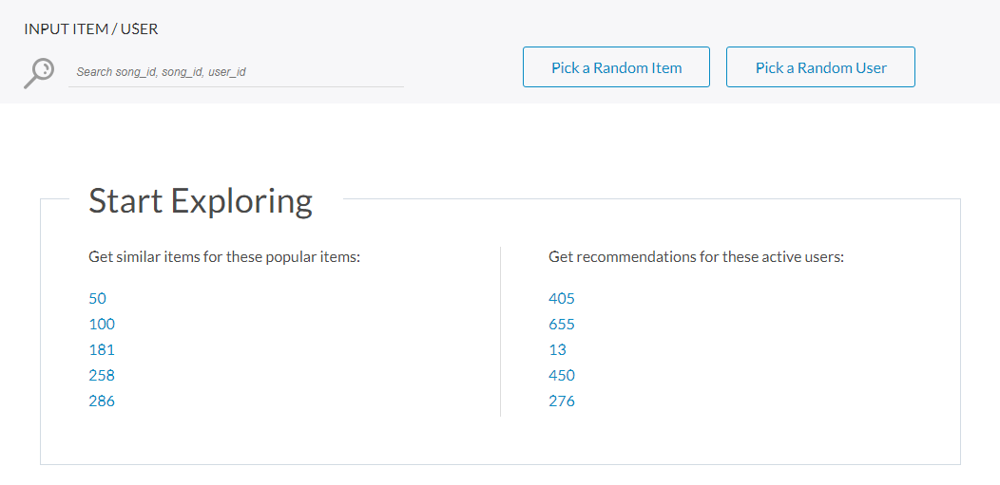

In [4]:

Image(filename='images/out1.png')

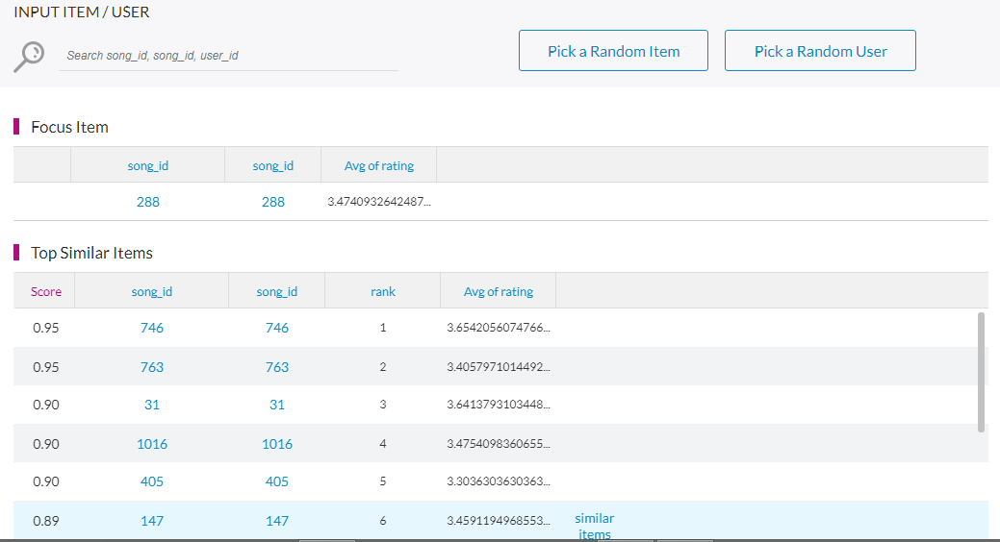

In [5]:
Image(filename='images/out2.png')

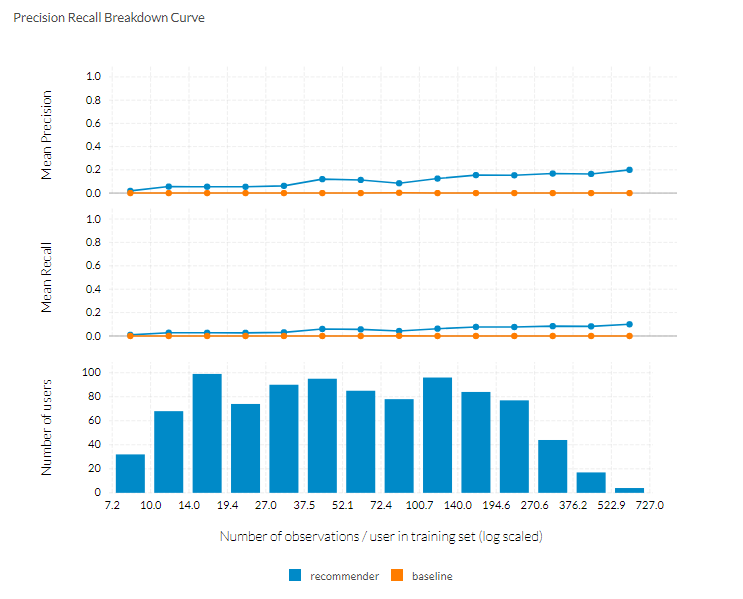

In [6]:
Image(filename='images/out3.png')

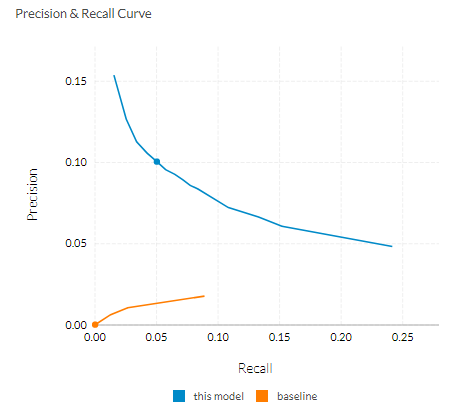

In [8]:

warnings.filterwarnings('ignore')
Image(filename='images/out4.png')
